# Title: Convolutional Neural Networks

## Convolutions
- In neural networks we use a discrete convolution
  - which is a linear operation that takes two functions and produces a third function that is typically viewed as a modified version of one of the original functions.
  - A sliding window of weights is applied to the input image to produce a single output pixel.

| 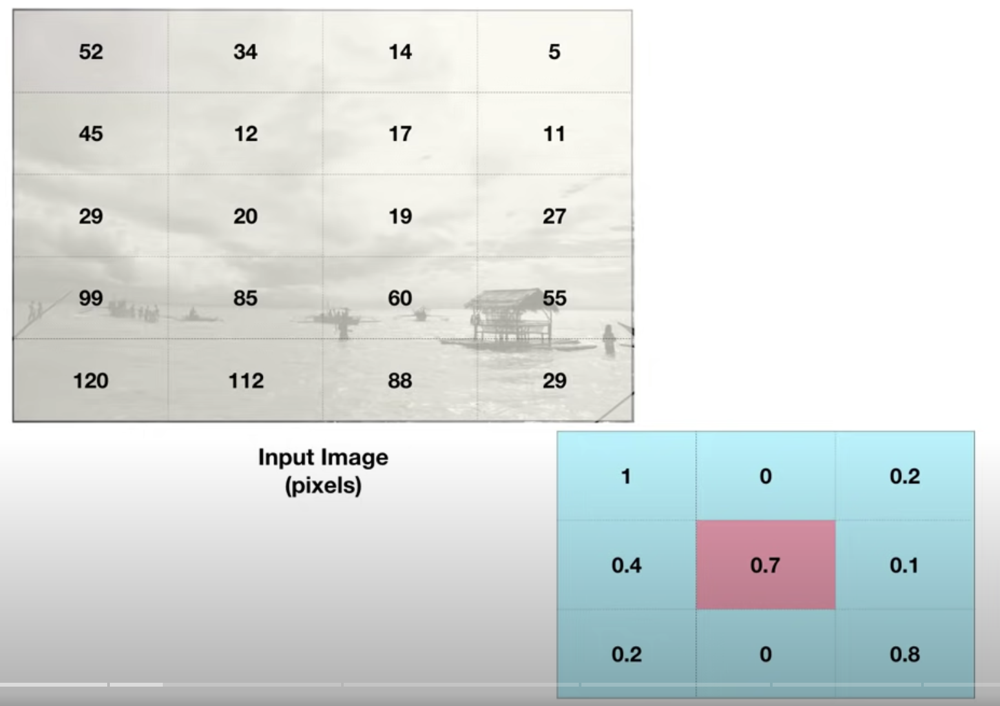 | 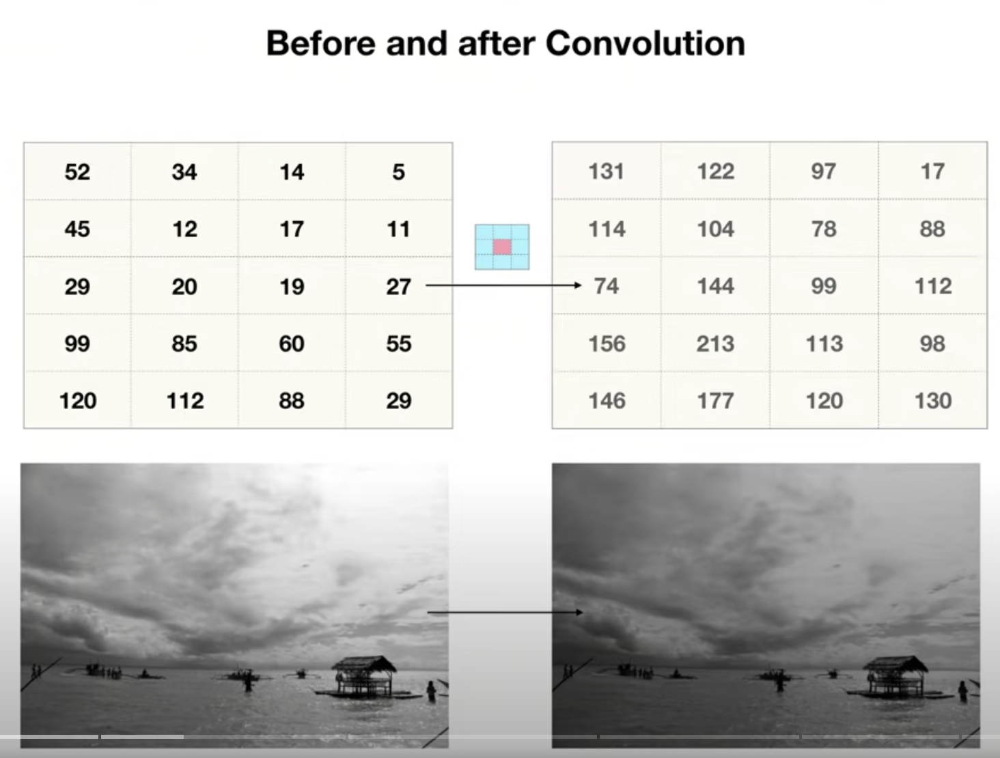 |
| :--- | :--- |


## Example

If we have a 3x3 image and a 2x2 filter, we can slide the filter over the image and perform element-wise multiplication and summing to produce a single output pixel.

Kernel A
```py
kernel = [[0.1,0.1,0.1],
          [0.1,0.1,0.1],
          [0.1,0.1,0.1]]
```

Kernel B
```py
kernel = [[0,0,0],
          [0,1,0],
          [0,0,0]]
```

Kernel C
```py
kernel = [[0,0,0],
          [0,2,0],
          [0,0,0]]
```

| Original | A | B | C |
| --- | --- | --- | --- |
| Original | Blurred | Same | Brighter |
| 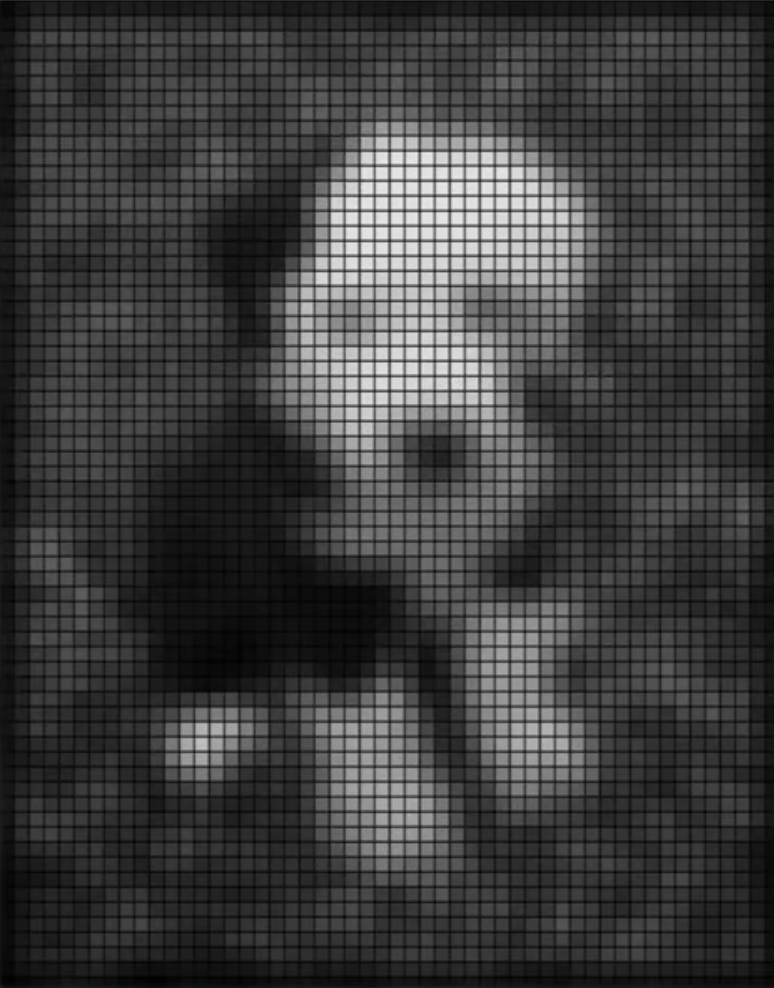 | 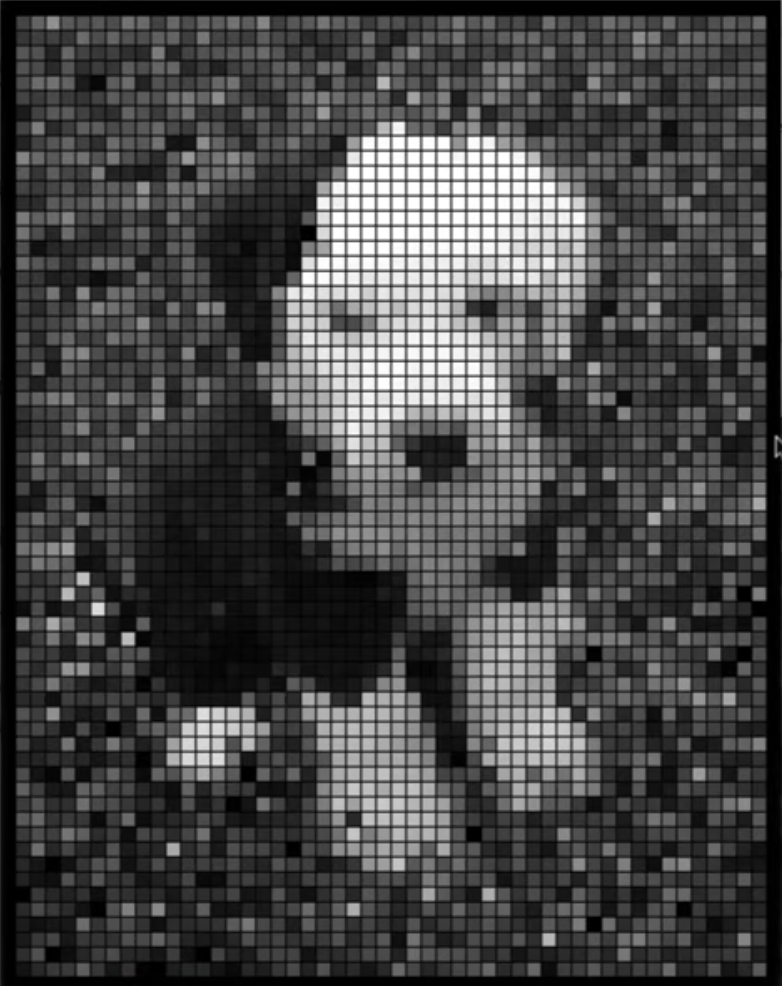 | 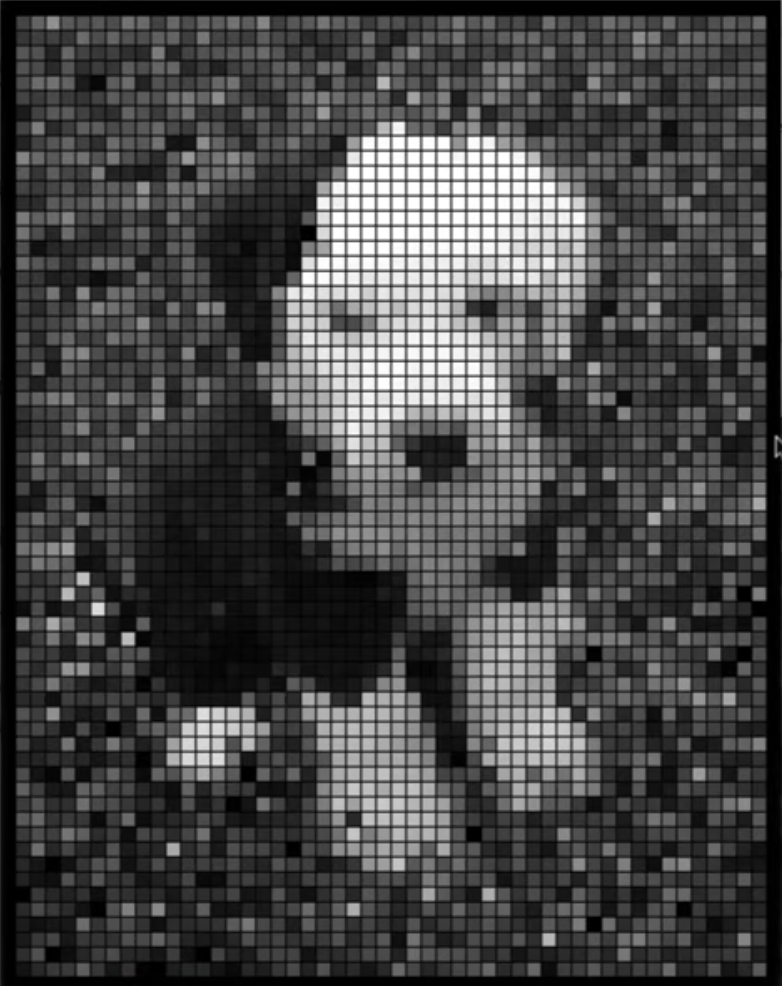 | 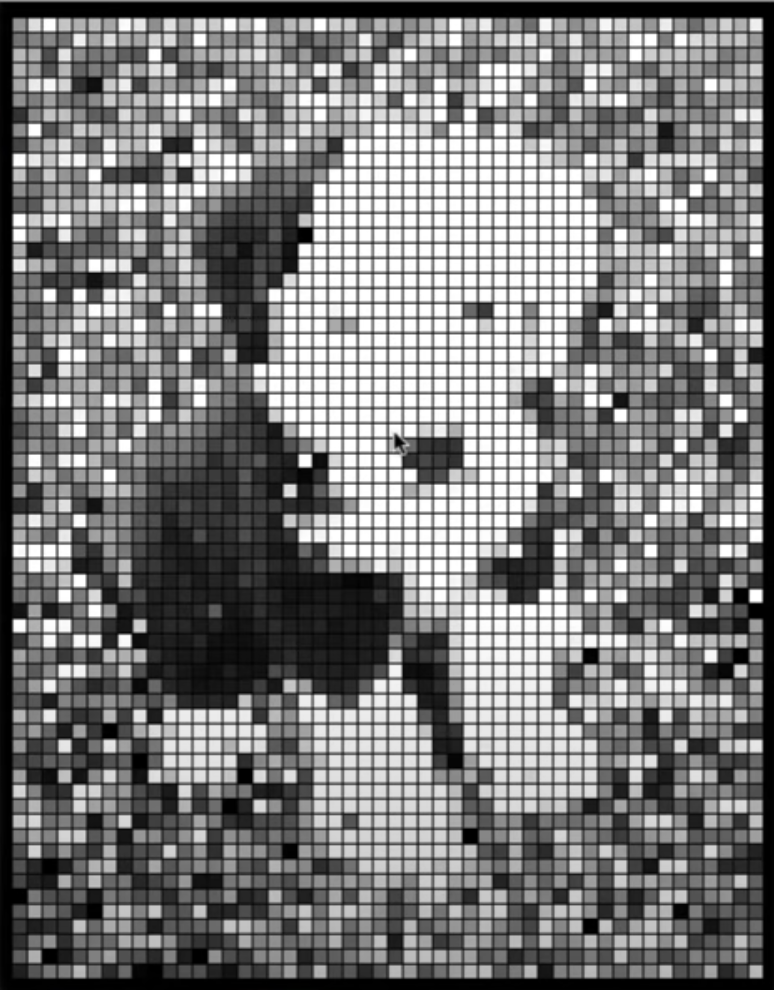 |


Convolve over the images RGB channels and add them up to produce a single output image.

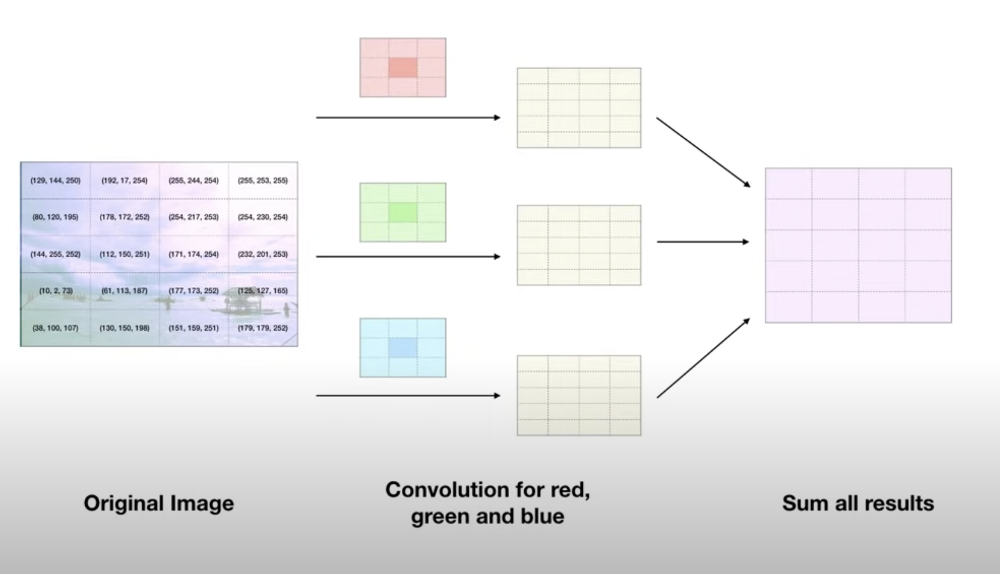

## Definitions
- Convolution Stride: The number of pixels to slide the filter over the image. (i.e move 2 across vs 1 across)
- Zero Padding: Add a border of zeros around the image to ensure the output image is the same size as the input image.
- Pooling: A technique to reduce the size of the image by sliding a filter over the image and taking the max or average of the values in the filter.


| Without Zero Padding | With Zero Padding | Pooling |
| --- | --- | --- |
| Without Zero Padding and constraining to within the edges of the image, the output image will be smaller than the input image. | With Zero Padding Preserves the size of the image | Pooling is a technique to reduce the size of the image by sliding a filter over the image and taking the max or average of the values in the filter. |
| 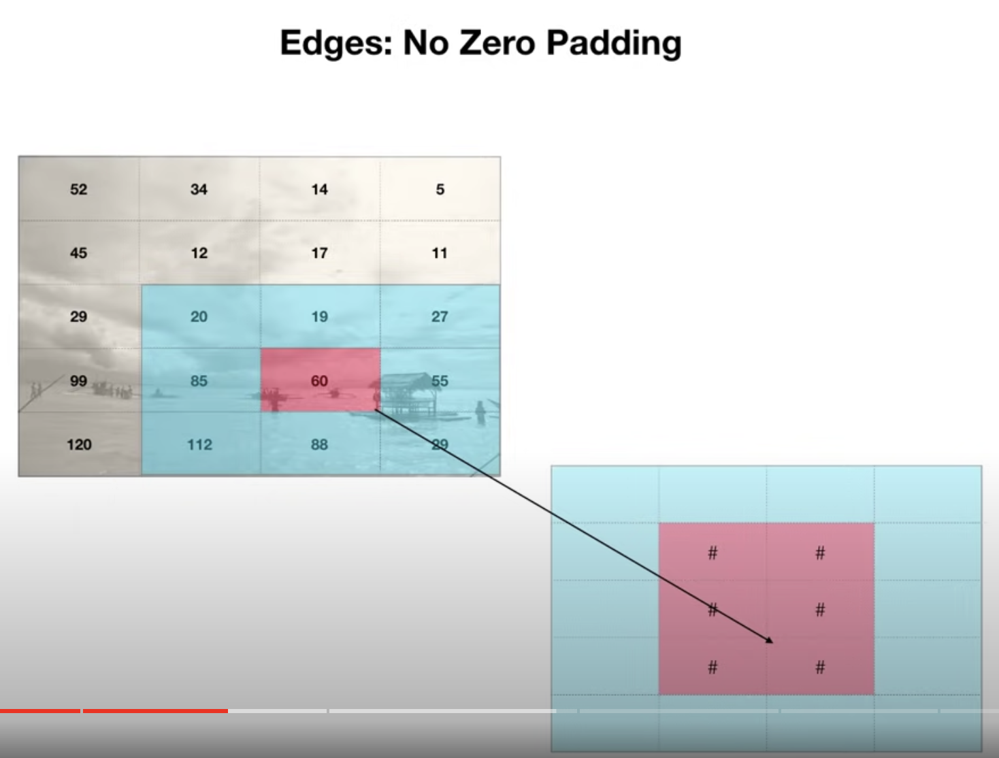 | 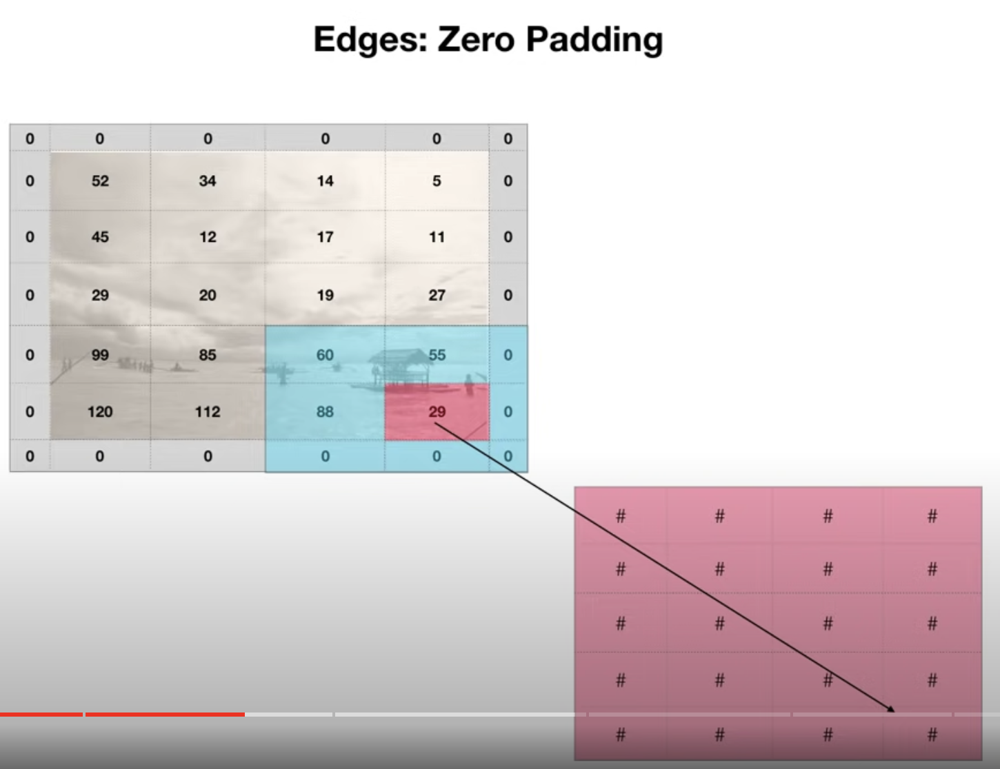 | 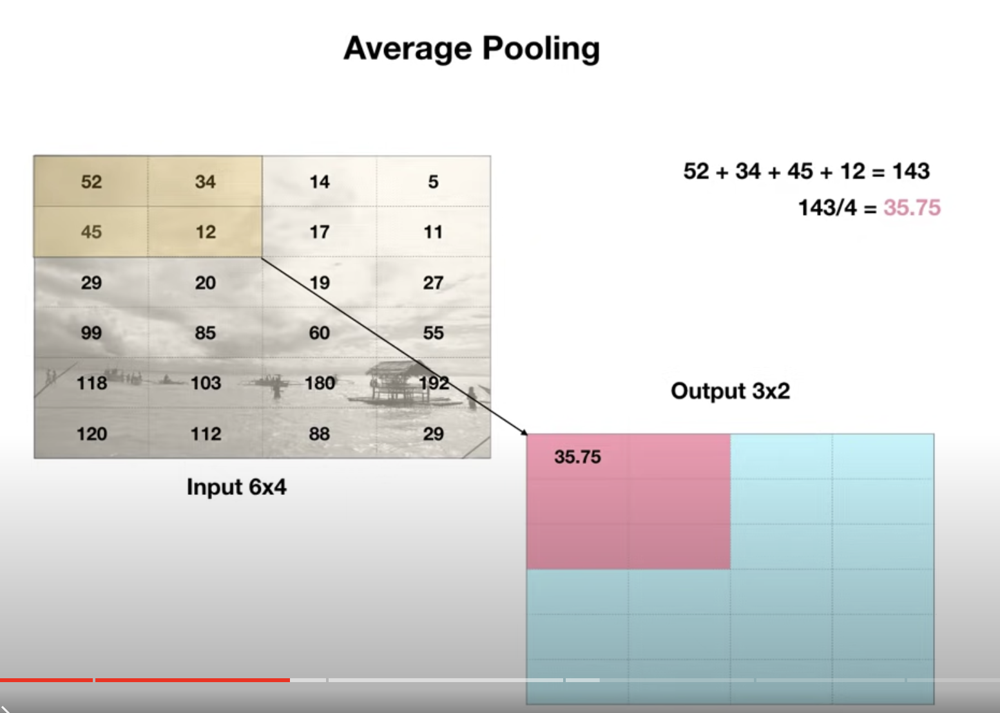 |


# Implementing a CNN with Keras

## Imports

In [37]:
from keras.datasets import mnist
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Dropout, Dense, Flatten
from keras.utils import np_utils
from dotdict import dotdict

## Setup W&B

In [4]:
from wandb.keras import WandbCallback
import wandb

# Set the notebook name for W&B
%env "WANDB_NOTEBOOK_NAME" "3-CNN"
wandb.login()


env: "WANDB_NOTEBOOK_NAME"="3-CNN"


True

## Model Config

In [58]:
config = dotdict()
config.img_width = 28
config.img_height = 28
config.first_layer_conv_width = 3
config.first_layer_conv_height = 3
config.dense_layer_size = 100
config.epochs = 10


## Load and Normalise Input

In [38]:
(X_train, y_train), (X_test, y_test) = mnist.load_data()

X_train = X_train.astype('float32')
X_train /= 255.
X_test = X_test.astype('float32')
X_test /= 255.

## Add zeros padding

# X_train = tf.pad(X_train, [[0, 0], [1, 1], [1,1]],mode="CONSTANT")
# X_train.shape

## Reshape Input
Because MNSIT is a grayscale image, we only have a single channel. However, Keras expects a 3D input, so we need to add a channel dimension.

In [52]:
X_train = X_train.reshape(
    X_train.shape[0], config.img_width, config.img_height, 1)
X_test = X_test.reshape(
    X_test.shape[0], config.img_width, config.img_height, 1)


## One hot encode outputs

In [53]:
y_train = np_utils.to_categorical(y_train)
y_test = np_utils.to_categorical(y_test)
num_classes = y_test.shape[1]
labels=range(10)

In [54]:
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(60000, 28, 28, 1) (10000, 28, 28, 1) (60000, 10) (10000, 10)


## Define Model and initialise W&B

- We're doing 32 convolutions of 3x3 filters, with a stride of 1 and a ReLU activation function
- We need to specify the input shape, which is the shape of a single image (28x28x1)


In [21]:
# Init W&B
run = wandb.init(config=config)

# build model
model = Sequential()
model.add(Conv2D(32,
                 (config.first_layer_conv_width, config.first_layer_conv_height),
                 input_shape=(28, 28, 1),
                 activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Flatten())
model.add(Dropout(0.2))
model.add(Dense(config.dense_layer_size, activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(num_classes, activation='softmax'))


model.compile(loss='categorical_crossentropy', optimizer='adam',
              metrics=['accuracy'])


## Summary

- We can see that the output of the convolutional layer is 26x26x32, which is the result of the 32 convolutions we did.
  - The new images are 26x26 because we used a stride of 1 and didn't use zero padding.
- There are 320 parameters in the convolutional layer, which is the result of 32 filters of 3x3x1 (the 1 is the number of channels in the input image) = 288 parameters, plus 32 bias parameters.
- The Max Pooling layer reduces the size of the image to 13x13x32, which is the result of the 2x2 filter we used. (i.e - cuts our images in half)
  - Max Pooling is the most common way to do this, but there are other ways.
- Our hidden layer has 540,900 parameters, which is the result of 540,800 parameters in the 13x13x32 input, plus 100 bias parameters.
- Our dropout layer has no parameters, because it's just a layer that randomly sets some of the values in the input to 0.
  - We have a 20% dropout rate, so 20% of the values in the input will be set to 0. Normal Values are between 0.2 and 0.5.

In [41]:
model.summary()


Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_1 (Conv2D)           (None, 26, 26, 32)        320       
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 13, 13, 32)       0         
 2D)                                                             
                                                                 
 flatten_1 (Flatten)         (None, 5408)              0         
                                                                 
 dense_2 (Dense)             (None, 100)               540900    
                                                                 
 dense_3 (Dense)             (None, 10)                1010      
                                                                 
Total params: 542,230
Trainable params: 542,230
Non-trainable params: 0
________________________________________________

## Train Model

In [24]:
model.fit(X_train, y_train, validation_data=(X_test, y_test),
          epochs=config.epochs,
          callbacks=[WandbCallback(data_type="image")])

run.finish() # Finish the W&B run


Epoch 1/10
1874/1875 [============================>.] - ETA: 0s - loss: 0.0609 - accuracy: 0.9814

2023-01-31 20:40:41.854318: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


2/2 [==============================] - 0s 66ms/step


2023-01-31 20:40:44.492702: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


INFO:tensorflow:Assets written to: /Users/samgreen/Development/ml/wandb/ml-class-notebooks/wandb/run-20230131_203857-r3cmodzf/files/model-best/assets


INFO:tensorflow:Assets written to: /Users/samgreen/Development/ml/wandb/ml-class-notebooks/wandb/run-20230131_203857-r3cmodzf/files/model-best/assets
wandb: Adding directory to artifact (/Users/samgreen/Development/ml/wandb/ml-class-notebooks/wandb/run-20230131_203857-r3cmodzf/files/model-best)... Done. 0.0s


1875/1875 [==============================] - 23s 12ms/step - loss: 0.0609 - accuracy: 0.9815 - val_loss: 0.0589 - val_accuracy: 0.9801
Epoch 2/10
2/2 [==============================] - 0s 3ms/step0s - loss: 0.0396 - accuracy: 0.98


INFO:tensorflow:Assets written to: /Users/samgreen/Development/ml/wandb/ml-class-notebooks/wandb/run-20230131_203857-r3cmodzf/files/model-best/assets


INFO:tensorflow:Assets written to: /Users/samgreen/Development/ml/wandb/ml-class-notebooks/wandb/run-20230131_203857-r3cmodzf/files/model-best/assets
wandb: Adding directory to artifact (/Users/samgreen/Development/ml/wandb/ml-class-notebooks/wandb/run-20230131_203857-r3cmodzf/files/model-best)... Done. 0.0s


1875/1875 [==============================] - 23s 12ms/step - loss: 0.0396 - accuracy: 0.9882 - val_loss: 0.0478 - val_accuracy: 0.9832
Epoch 3/10
2/2 [==============================] - 0s 3ms/step0s - loss: 0.0275 - accuracy: 0.99


INFO:tensorflow:Assets written to: /Users/samgreen/Development/ml/wandb/ml-class-notebooks/wandb/run-20230131_203857-r3cmodzf/files/model-best/assets


INFO:tensorflow:Assets written to: /Users/samgreen/Development/ml/wandb/ml-class-notebooks/wandb/run-20230131_203857-r3cmodzf/files/model-best/assets
wandb: Adding directory to artifact (/Users/samgreen/Development/ml/wandb/ml-class-notebooks/wandb/run-20230131_203857-r3cmodzf/files/model-best)... Done. 0.0s


1875/1875 [==============================] - 21s 11ms/step - loss: 0.0274 - accuracy: 0.9913 - val_loss: 0.0442 - val_accuracy: 0.9858
Epoch 4/10
2/2 [==============================] - 0s 3ms/step0s - loss: 0.0180 - accuracy: 0.99


INFO:tensorflow:Assets written to: /Users/samgreen/Development/ml/wandb/ml-class-notebooks/wandb/run-20230131_203857-r3cmodzf/files/model-best/assets


INFO:tensorflow:Assets written to: /Users/samgreen/Development/ml/wandb/ml-class-notebooks/wandb/run-20230131_203857-r3cmodzf/files/model-best/assets
wandb: Adding directory to artifact (/Users/samgreen/Development/ml/wandb/ml-class-notebooks/wandb/run-20230131_203857-r3cmodzf/files/model-best)... Done. 0.0s


1875/1875 [==============================] - 21s 11ms/step - loss: 0.0180 - accuracy: 0.9944 - val_loss: 0.0429 - val_accuracy: 0.9851
Epoch 5/10
2/2 [==============================] - 0s 3ms/step0s - loss: 0.0139 - accuracy: 0.99


INFO:tensorflow:Assets written to: /Users/samgreen/Development/ml/wandb/ml-class-notebooks/wandb/run-20230131_203857-r3cmodzf/files/model-best/assets


INFO:tensorflow:Assets written to: /Users/samgreen/Development/ml/wandb/ml-class-notebooks/wandb/run-20230131_203857-r3cmodzf/files/model-best/assets
wandb: Adding directory to artifact (/Users/samgreen/Development/ml/wandb/ml-class-notebooks/wandb/run-20230131_203857-r3cmodzf/files/model-best)... Done. 0.0s


1875/1875 [==============================] - 21s 11ms/step - loss: 0.0139 - accuracy: 0.9956 - val_loss: 0.0406 - val_accuracy: 0.9870
Epoch 6/10
1875/1875 [==============================] - 21s 11ms/step - loss: 0.0094 - accuracy: 0.9970 - val_loss: 0.0493 - val_accuracy: 0.9861
Epoch 7/10
1875/1875 [==============================] - 21s 11ms/step - loss: 0.0075 - accuracy: 0.9977 - val_loss: 0.0570 - val_accuracy: 0.9850
Epoch 8/10
1875/1875 [==============================] - 20s 11ms/step - loss: 0.0053 - accuracy: 0.9983 - val_loss: 0.0532 - val_accuracy: 0.9856
Epoch 9/10
1875/1875 [==============================] - 21s 11ms/step - loss: 0.0053 - accuracy: 0.9982 - val_loss: 0.0556 - val_accuracy: 0.9857
Epoch 10/10
1875/1875 [==============================] - 20s 11ms/step - loss: 0.0036 - accuracy: 0.9990 - val_loss: 0.0539 - val_accuracy: 0.9875


accuracy,▁▄▅▆▇▇▇███
epoch,▁▂▃▃▄▅▆▆▇█
loss,█▅▄▃▂▂▁▁▁▁
val_accuracy,▁▄▆▆█▇▆▆▆█
val_loss,█▄▂▂▁▄▇▆▇▆
accuracy,0.99902
best_epoch,4
best_val_loss,0.04058
epoch,9
loss,0.00364
val_accuracy,0.9875


## Results

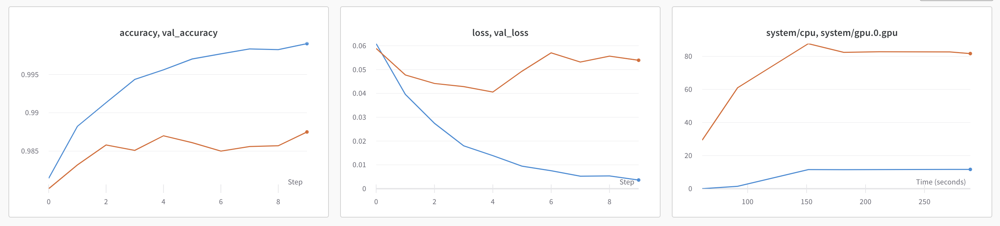

## A Typical Visualised example of what's happening in a CNN

* Notice at the top that the eighth neuron is lit up

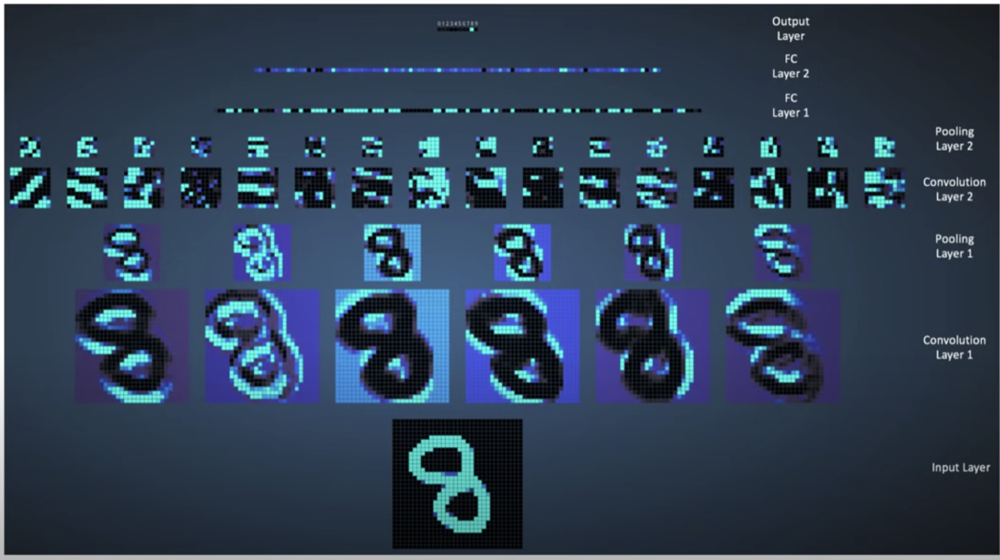

In [55]:
# Init W&B
run = wandb.init(config=config)

# build model2
model2 = Sequential()
model2.add(Conv2D(32,
                 (config.first_layer_conv_width, config.first_layer_conv_height),
                 input_shape=(28, 28, 1),
                 activation='relu'))
model2.add(MaxPooling2D(pool_size=(2, 2)))
model2.add(Conv2D(10,
                 (config.first_layer_conv_width, config.first_layer_conv_height),
                 input_shape=(13, 13, 1),
                 activation='relu'))
model2.add(MaxPooling2D(pool_size=(2, 2)))
model2.add(Flatten())
model2.add(Dropout(0.2))
model2.add(Dense(config.dense_layer_size, activation='relu'))
model2.add(Dropout(0.2))
model2.add(Dense(num_classes, activation='softmax'))


model2.compile(loss='categorical_crossentropy', optimizer='adam',
              metrics=['accuracy'])

In [50]:
model2.summary()


Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_8 (Conv2D)           (None, 26, 26, 32)        320       
                                                                 
 max_pooling2d_8 (MaxPooling  (None, 13, 13, 32)       0         
 2D)                                                             
                                                                 
 conv2d_9 (Conv2D)           (None, 11, 11, 10)        2890      
                                                                 
 max_pooling2d_9 (MaxPooling  (None, 5, 5, 10)         0         
 2D)                                                             
                                                                 
 flatten_5 (Flatten)         (None, 250)               0         
                                                                 
 dropout_6 (Dropout)         (None, 250)              

In [56]:
model2.fit(X_train, y_train, validation_data=(X_test, y_test),
          epochs=config.epochs,
          callbacks=[WandbCallback(data_type="image")])

run.finish()  # Finish the W&B run


Epoch 1/10


2023-01-31 21:29:37.280628: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


   3/1875 [..............................] - ETA: 1:41 - loss: 2.3186 - accuracy: 0.1042 WARNING:tensorflow:Callback method `on_train_batch_end` is slow compared to the batch time (batch time: 0.0106s vs `on_train_batch_end` time: 0.0167s). Check your callbacks.


1875/1875 [==============================] - ETA: 0s - loss: 0.2301 - accuracy: 0.9285

2023-01-31 21:30:00.233385: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


2/2 [==============================] - 0s 162ms/step


2023-01-31 21:30:02.833113: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


INFO:tensorflow:Assets written to: /Users/samgreen/Development/ml/wandb/ml-class-notebooks/wandb/run-20230131_212921-f3kquukm/files/model-best/assets


INFO:tensorflow:Assets written to: /Users/samgreen/Development/ml/wandb/ml-class-notebooks/wandb/run-20230131_212921-f3kquukm/files/model-best/assets
wandb: Adding directory to artifact (/Users/samgreen/Development/ml/wandb/ml-class-notebooks/wandb/run-20230131_212921-f3kquukm/files/model-best)... Done. 0.0s


1875/1875 [==============================] - 27s 14ms/step - loss: 0.2301 - accuracy: 0.9285 - val_loss: 0.0614 - val_accuracy: 0.9797
Epoch 2/10
2/2 [==============================] - 0s 4ms/step0s - loss: 0.0831 - accuracy: 0.97


INFO:tensorflow:Assets written to: /Users/samgreen/Development/ml/wandb/ml-class-notebooks/wandb/run-20230131_212921-f3kquukm/files/model-best/assets


INFO:tensorflow:Assets written to: /Users/samgreen/Development/ml/wandb/ml-class-notebooks/wandb/run-20230131_212921-f3kquukm/files/model-best/assets
wandb: Adding directory to artifact (/Users/samgreen/Development/ml/wandb/ml-class-notebooks/wandb/run-20230131_212921-f3kquukm/files/model-best)... Done. 0.0s


1875/1875 [==============================] - 24s 13ms/step - loss: 0.0831 - accuracy: 0.9743 - val_loss: 0.0477 - val_accuracy: 0.9849
Epoch 3/10
2/2 [==============================] - 0s 3ms/step0s - loss: 0.0646 - accuracy: 0.98


INFO:tensorflow:Assets written to: /Users/samgreen/Development/ml/wandb/ml-class-notebooks/wandb/run-20230131_212921-f3kquukm/files/model-best/assets


INFO:tensorflow:Assets written to: /Users/samgreen/Development/ml/wandb/ml-class-notebooks/wandb/run-20230131_212921-f3kquukm/files/model-best/assets
wandb: Adding directory to artifact (/Users/samgreen/Development/ml/wandb/ml-class-notebooks/wandb/run-20230131_212921-f3kquukm/files/model-best)... Done. 0.0s


1875/1875 [==============================] - 23s 12ms/step - loss: 0.0646 - accuracy: 0.9805 - val_loss: 0.0386 - val_accuracy: 0.9864
Epoch 4/10
2/2 [==============================] - 0s 3ms/step0s - loss: 0.0545 - accuracy: 0.98


INFO:tensorflow:Assets written to: /Users/samgreen/Development/ml/wandb/ml-class-notebooks/wandb/run-20230131_212921-f3kquukm/files/model-best/assets


INFO:tensorflow:Assets written to: /Users/samgreen/Development/ml/wandb/ml-class-notebooks/wandb/run-20230131_212921-f3kquukm/files/model-best/assets
wandb: Adding directory to artifact (/Users/samgreen/Development/ml/wandb/ml-class-notebooks/wandb/run-20230131_212921-f3kquukm/files/model-best)... Done. 0.0s


1875/1875 [==============================] - 25s 13ms/step - loss: 0.0545 - accuracy: 0.9828 - val_loss: 0.0377 - val_accuracy: 0.9883
Epoch 5/10
2/2 [==============================] - 0s 4ms/step0s - loss: 0.0489 - accuracy: 0.98


INFO:tensorflow:Assets written to: /Users/samgreen/Development/ml/wandb/ml-class-notebooks/wandb/run-20230131_212921-f3kquukm/files/model-best/assets


INFO:tensorflow:Assets written to: /Users/samgreen/Development/ml/wandb/ml-class-notebooks/wandb/run-20230131_212921-f3kquukm/files/model-best/assets
wandb: Adding directory to artifact (/Users/samgreen/Development/ml/wandb/ml-class-notebooks/wandb/run-20230131_212921-f3kquukm/files/model-best)... Done. 0.0s


1875/1875 [==============================] - 26s 14ms/step - loss: 0.0489 - accuracy: 0.9841 - val_loss: 0.0333 - val_accuracy: 0.9886
Epoch 6/10
2/2 [==============================] - 0s 4ms/step0s - loss: 0.0423 - accuracy: 0.98


INFO:tensorflow:Assets written to: /Users/samgreen/Development/ml/wandb/ml-class-notebooks/wandb/run-20230131_212921-f3kquukm/files/model-best/assets


INFO:tensorflow:Assets written to: /Users/samgreen/Development/ml/wandb/ml-class-notebooks/wandb/run-20230131_212921-f3kquukm/files/model-best/assets
wandb: Adding directory to artifact (/Users/samgreen/Development/ml/wandb/ml-class-notebooks/wandb/run-20230131_212921-f3kquukm/files/model-best)... Done. 0.0s


1875/1875 [==============================] - 26s 14ms/step - loss: 0.0424 - accuracy: 0.9866 - val_loss: 0.0279 - val_accuracy: 0.9902
Epoch 7/10
1875/1875 [==============================] - 25s 13ms/step - loss: 0.0389 - accuracy: 0.9881 - val_loss: 0.0290 - val_accuracy: 0.9904
Epoch 8/10
1875/1875 [==============================] - 25s 13ms/step - loss: 0.0372 - accuracy: 0.9883 - val_loss: 0.0286 - val_accuracy: 0.9901
Epoch 9/10
2/2 [==============================] - 0s 4ms/step0s - loss: 0.0337 - accuracy: 0.98


INFO:tensorflow:Assets written to: /Users/samgreen/Development/ml/wandb/ml-class-notebooks/wandb/run-20230131_212921-f3kquukm/files/model-best/assets


INFO:tensorflow:Assets written to: /Users/samgreen/Development/ml/wandb/ml-class-notebooks/wandb/run-20230131_212921-f3kquukm/files/model-best/assets
wandb: Adding directory to artifact (/Users/samgreen/Development/ml/wandb/ml-class-notebooks/wandb/run-20230131_212921-f3kquukm/files/model-best)... Done. 0.0s


1875/1875 [==============================] - 26s 14ms/step - loss: 0.0336 - accuracy: 0.9898 - val_loss: 0.0227 - val_accuracy: 0.9928
Epoch 10/10
1875/1875 [==============================] - 25s 13ms/step - loss: 0.0307 - accuracy: 0.9901 - val_loss: 0.0263 - val_accuracy: 0.9907


accuracy,▁▆▇▇▇█████
epoch,▁▂▃▃▄▅▆▆▇█
loss,█▃▂▂▂▁▁▁▁▁
val_accuracy,▁▄▅▆▆▇▇▇█▇
val_loss,█▆▄▄▃▂▂▂▁▂
accuracy,0.99005
best_epoch,8
best_val_loss,0.02266
epoch,9
loss,0.03073
val_accuracy,0.9907


## Summary of the model

Slight improvement over the previous model.

0.9907 (with additional layers) vs. 0.9875 (without additional layers) and not overfitting

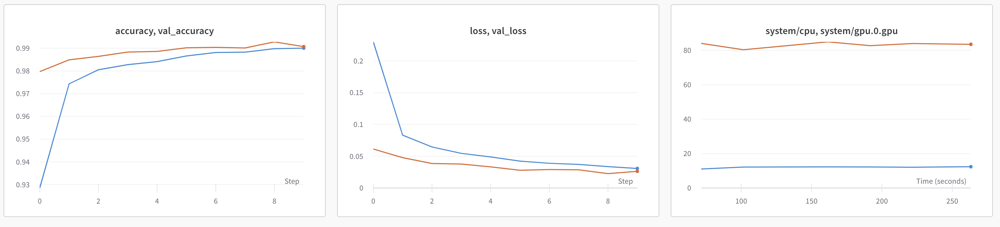
